# Outline

This includes:
1. Introduction
    - What is a Hashtag
    - Why SNA for Hashtags?
    - What aspects of graph theory can we use in our analysis?
2. Import libraries
3. Hashtag preparation
4. Negative tweets analysis
5. Positive tweeets analysis
6. Building graphs
    - Negative hash Graph
    - Positive hash Graph
7. Positive hash analysis
    - Centrality measures
    - Ego-network
    - Users with one hashtag
    - Sub-graph analysis
    - Weekly connected components
    - Cliques
    - Clustering and Transitivity
    - Diameter and Distance

## 1. Introduction

This includes:
    - What is a Hashtag
    - Why SNA for Hashtags?
    - What aspects of graph theory can we use in our?

### 1.1 What is a Hashtag

"**A hashtag — introduced by the octothorpe symbol (#) —** is a type of metadata tag used on social networks such as Twitter and other microblogging services. It lets users apply dynamic, user-generated tagging that helps other users easily find messages with a specific theme or content"

People often end an Twitter post with a series of hashtags. Hashtags can provide a succinct summary of what that person was thinking, feeling and observing in that moment. Hashtags provide context and meaning that the image alone is unable to.

**Hashtags** always hold some meaningful insights. They mostly express the essence of the whole tweet in one word or denotes the person or place or something about which the tweet talks about.

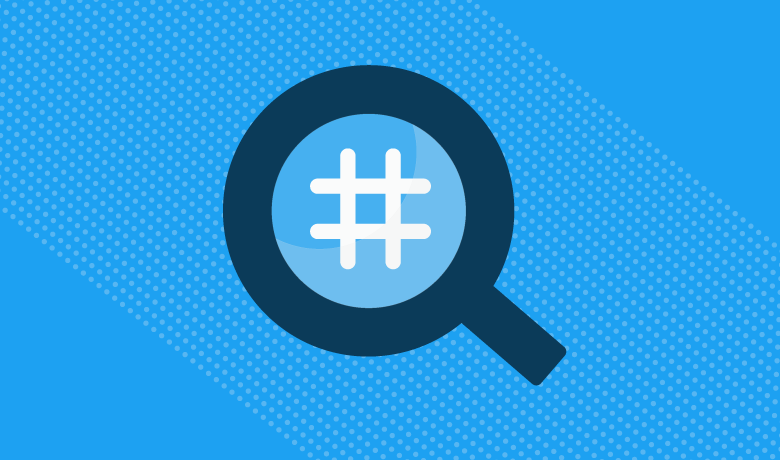

In [1]:
from IPython.display import display
from PIL import Image

path="C:\\Users\\lenovo\\Tutorials\\03. Data Science\\DS images 2\\hashtag.png"
display(Image.open(path))

### 1.2 Why SNA for Hashtags

**For this purpose,** we will use Social Network analysis (SNA). SNA has recently emerged as a very powerful and popular method for modeling meaningful and often hidden relationships in online communities. NetworkX offers many functions for us to use in various network analysis problems and a programming language like Python gives us the flexibility to explore various network computationally in many different ways like finding out the most important and influential nodes in the network, best connectors in the network, degree to which the network is connected and many more.

**I like to think** of Network Science and graph theory as methods that allow us to understand how things are connected. We can borrow some basic principles from Network Science and graph theory to understand how hashtags on Twitter are connected.

It has been shown that graph theory can be a very intuitive and useful way to explore social media metadata such as hashtags. Its application could be in two immediate areas:

1. **We might want** to graph thematic entities e.g people posting about sustainability, Brexit, Coronavirus.

2. **We could use** graphs to model and understand the conversation around specific brands, events and places.

### 1.3 What aspects of graph theory can we use in our analysis?

- **Community Detection.** We can use algorithms to identify and label clusters of topics/themes that are associated with one theme.
- **Degree Centrality / Betweenness Centrality.** We can calculate what hashtags in the network are particularly important in linking the whole network. Much like Heathrow Airport links up a lot of the world.
- **Visualization.** If we plot the network using scatterplots, it’s a very compelling way to visualise a huge amount of information about one theme that would be cumbersome to do otherwise.

## 2. Import libraries

In [1]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns # for visualization
import matplotlib.pyplot as plt # for visualization
from IPython.display import display
import networkx as nx
import re
from collections import Counter

In [2]:
pd.set_option("display.max_colwidth", 200) 
warnings.filterwarnings("ignore", category=DeprecationWarning) 

%matplotlib inline

## 3. Hashtag preparation

In [3]:
# 1) read dataset
df = pd.read_csv('C:/Users/lenovo/Desktop/hate_speech_detection/data_analyzed_df.csv', index_col=[0])
df = df[['id','label','tweet','hashtag']]
df.head()

,id,label,tweet,hashtag
0,1,0.0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,run
1,2,0.0,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,lyft disapointed getthanked
2,3,0.0,bihday your majesty,NaN
3,4,0.0,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model
4,5,0.0,factsguide: society now #motivation,motivation


We will suppose that every user is associated with exactly one tweet. As such, we will build a new column for users.

The goal now is extract the hashtags associated with each user. This will be necessary to build graphs. This requires a number of steps:

In [4]:
# 2) add a new column with increasing value consisting aplha-numeric
# convert index to strings and use str.zfill:
df['users'] = 'user_' +  df.index.astype(str).str.zfill(1)
df = df[['id','label','users', 'tweet','hashtag']]
df

,id,label,users,tweet,hashtag
0,1,0.0,user_0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,run
1,2,0.0,user_1,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,lyft disapointed getthanked
2,3,0.0,user_2,bihday your majesty,NaN
3,4,0.0,user_3,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model
4,5,0.0,user_4,factsguide: society now #motivation,motivation
...,...,...,...,...,...
49154,49155,NaN,user_49154,thought factory: left-right polarisation! #trump #uselections2016 #leadership #politics #brexit #blm &gt;3,trump uselections leadership politics brexit blm
49155,49156,NaN,user_49155,feeling like a mermaid ð #hairflip #neverready #formal #wedding #gown #dresses #mermaid â¦,hairflip neverready formal wedding gown dresses mermaid
49156,49157,NaN,user_49156,"#hillary #campaigned today in #ohio((omg)) &amp; used words like ""assets&amp;liability"" never once did #clinton say thee(word) #radicalization",hillary campaigned ohio omg clinton radicalization
49157,49158,NaN,user_49157,"happy, at work conference: right mindset leads to culture-of-development organizations #work #mindset",work mindset


**Hashtag distributioin**

We want to find the frequency of each #hashtag. As such, we will split hashtags into severl rows

In [5]:
# 3) Convert column to string because some of the values appeared to be floats, not strings.
df['hashtag'] = df['hashtag'].apply(str)

# The '\W+' will split the sentence if it sees one or more non word characters
def tokenize(text):
    tokens = re.split('\W+', text)
    return tokens

# The data is assigned to a new column
df['verbatim_tokenized'] = df['hashtag'].apply(lambda x: tokenize(x))
df.head()

,id,label,users,tweet,hashtag,verbatim_tokenized
0,1,0.0,user_0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,run,"[, run]"
1,2,0.0,user_1,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,lyft disapointed getthanked,"[, lyft, disapointed, getthanked]"
2,3,0.0,user_2,bihday your majesty,nan,[nan]
3,4,0.0,user_3,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model,"[, model]"
4,5,0.0,user_4,factsguide: society now #motivation,motivation,"[, motivation]"


In [6]:
# 4) convert list to string
df['liststring'] = [','.join(map(str, l)) for l in df['verbatim_tokenized']]
df.head()

,id,label,users,tweet,hashtag,verbatim_tokenized,liststring
0,1,0.0,user_0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,run,"[, run]",",run"
1,2,0.0,user_1,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,lyft disapointed getthanked,"[, lyft, disapointed, getthanked]",",lyft,disapointed,getthanked"
2,3,0.0,user_2,bihday your majesty,nan,[nan],nan
3,4,0.0,user_3,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model,"[, model]",",model"
4,5,0.0,user_4,factsguide: society now #motivation,motivation,"[, motivation]",",motivation"


In [7]:
# 5) remove commas from liststring on both sides
df['liststring'] = df['liststring'].str.rstrip(',')
df['liststring'] = df['liststring'].str.lstrip(',')
df.head()

,id,label,users,tweet,hashtag,verbatim_tokenized,liststring
0,1,0.0,user_0,@user when a father is dysfunctional and is so selfish he drags his kids into his dysfunction. #run,run,"[, run]",run
1,2,0.0,user_1,@user @user thanks for #lyft credit i can't use cause they don't offer wheelchair vans in pdx. #disapointed #getthanked,lyft disapointed getthanked,"[, lyft, disapointed, getthanked]","lyft,disapointed,getthanked"
2,3,0.0,user_2,bihday your majesty,nan,[nan],nan
3,4,0.0,user_3,#model i love u take with u all the time in urð±!!! ðððð ð¦ð¦ð¦,model,"[, model]",model
4,5,0.0,user_4,factsguide: society now #motivation,motivation,"[, motivation]",motivation


In [8]:
# 6) use explode() to split hashtags into severl rows
df = df.assign(liststring=df['liststring'].str.split(',')).explode('liststring')
df = df[['label','users','liststring']]
df

,label,users,liststring
0,0.0,user_0,run
1,0.0,user_1,lyft
1,0.0,user_1,disapointed
1,0.0,user_1,getthanked
2,0.0,user_2,nan
...,...,...,...
49157,NaN,user_49157,work
49157,NaN,user_49157,mindset
49158,NaN,user_49158,shoegaze
49158,NaN,user_49158,newmusic


In [9]:
# 7) remove rows with no hashtags
df = df[df['liststring']!= 'nan']
df

,label,users,liststring
0,0.0,user_0,run
1,0.0,user_1,lyft
1,0.0,user_1,disapointed
1,0.0,user_1,getthanked
3,0.0,user_3,model
...,...,...,...
49157,NaN,user_49157,work
49157,NaN,user_49157,mindset
49158,NaN,user_49158,shoegaze
49158,NaN,user_49158,newmusic


In [10]:
# hashtag distribution (all)
print(df['liststring'].value_counts())
print(len(df['liststring'].value_counts()))

love                2442
positive            1332
healthy              904
smile                856
thankful             724
                    ... 
hmku                   1
upsanddowns            1
prankcall              1
greegewekaziquee       1
eldiasellego           1
Name: liststring, Length: 30172, dtype: int64
30172


## 4. Negative tweets analysis

In [11]:
# negative tweets
neg_tweet_df = df[df['label']==0]
neg_tweet_df

,label,users,liststring
0,0.0,user_0,run
1,0.0,user_1,lyft
1,0.0,user_1,disapointed
1,0.0,user_1,getthanked
3,0.0,user_3,model
...,...,...,...
31955,0.0,user_31955,mallorca
31955,0.0,user_31955,holidays
31955,0.0,user_31955,summer
31958,0.0,user_31958,shame


In [12]:
# hashtag distribution of negative tweets
print(neg_tweet_df['liststring'].value_counts())
print(len(neg_tweet_df['liststring'].value_counts()))

love            1580
positive         879
smile            577
healthy          575
thankful         471
                ... 
hindusena          1
positivemind       1
unite              1
monkeybum          1
uglybitches        1
Name: liststring, Length: 21099, dtype: int64
21099


In [13]:
# Negative tweets: top users
neg_tweet_grp = neg_tweet_df.groupby('users').size()
neg_tweet_grp = pd.DataFrame(neg_tweet_grp).reset_index()
neg_tweet_grp.columns = ['users','hash_count']
neg_tweet_grp = neg_tweet_grp.sort_values(by=['hash_count'],ascending = False)
neg_tweet_grp

,users,hash_count
20015,user_773,18
2373,user_13117,17
3865,user_15076,17
19661,user_7259,17
10923,user_24444,16
...,...,...
16328,user_31627,1
16326,user_31625,1
7780,user_20280,1
7781,user_20281,1


## 5. Positive tweets analysis

In [14]:
# positive tweets
pos_tweet_df = df[df['label']==1]
pos_tweet_df

,label,users,liststring
13,1.0,user_13,cnn
13,1.0,user_13,michigan
13,1.0,user_13,tcot
14,1.0,user_14,australia
14,1.0,user_14,opkillingbay
...,...,...,...
31946,1.0,user_31946,liberalisme
31960,1.0,user_31960,sikh
31960,1.0,user_31960,temple
31960,1.0,user_31960,calgary


In [15]:
# hashtag distribution of positive tweets
print(pos_tweet_df['liststring'].value_counts())
print(len(pos_tweet_df['liststring'].value_counts()))

trump                   134
politics                 95
allahsoil                92
libtard                  76
liberal                  75
                       ... 
ux                        1
hawaii                    1
unitedstateschampion      1
liberallogic              1
immature                  1
Name: liststring, Length: 1871, dtype: int64
1871


In [16]:
# Positive tweets: top users
pos_tweet_grp = pos_tweet_df.groupby('users').size()
pos_tweet_grp = pd.DataFrame(pos_tweet_grp).reset_index()
pos_tweet_grp.columns = ['users','hash_count']
pos_tweet_grp = pos_tweet_grp.sort_values(by=['hash_count'],ascending = False)
pos_tweet_grp

,users,hash_count
1198,user_31196,14
1382,user_5567,12
476,user_18497,12
1020,user_2784,11
393,user_16808,11
...,...,...
961,user_26759,1
157,user_12789,1
1270,user_3348,1
609,user_20828,1


## 6. Building graphs

Now, we can get to see how the Graph looks like. For that, we will use nx.drawing.layout to apply node positioning algorithms for the graph drawing. Specifically, we will use spring_layout that uses force-directed graph drawing which purpose is to position the nodes in two-dimensional space so that all the edges are of equal length and there are as few crossing edges as possible. It achieves this by assigning forces among the set of edges and nodes based on their relative positions and then uses this to simulate the motion of the edges and nodes.

One of the parameters that we can adjust is k, the optimal distance between nodes; as we increase the value, the nodes will farther apart.

**This includes:**
    - Negative hashtag graph
    - Positive hashtag graph

### 1. Negative hashtag graph

In [16]:
# create a directed-graph from the negative tweets dataframe
neg_graph=nx.from_pandas_edgelist(neg_tweet_df, "users", "liststring",
                          create_using=nx.DiGraph())

In [17]:
# Get graph info
print(nx.info(neg_graph))

Name: 
Type: DiGraph
Number of nodes: 42833
Number of edges: 70999
Average in degree:   1.6576
Average out degree:   1.6576


**An undirected graph** is connected if, for every pair of nodes, there is a path between them. For that to happen, most of the nodes should have at least a degree of two, except for those denominated leaves which have a degree of 1.

In [18]:
# check if connected
neg_graph_un = neg_graph.to_undirected()
nx.is_connected(neg_graph_un)

False

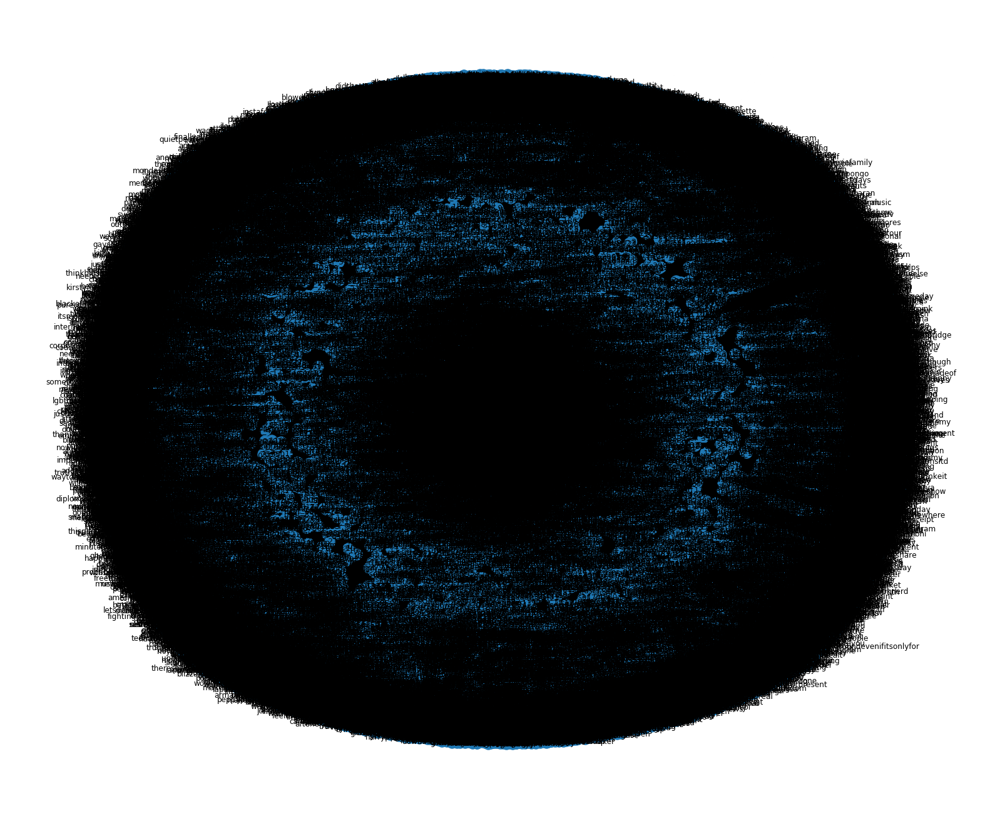

In [19]:
# Position nodes using Fruchterman-Reingold force-directed algorithm
pos = nx.spring_layout(neg_graph)

# Drawing the graph
from matplotlib.pyplot import figure
figure(figsize=(22, 18))
nx.draw(neg_graph, with_labels=True)
plt.show()

### 2. Positive hashtag graph

In [20]:
# create a directed-graph from the positive tweets dataframe
pos_graph=nx.from_pandas_edgelist(pos_tweet_df, "users", "liststring", 
                          create_using=nx.DiGraph())

In [21]:
# Get graph info
print(nx.info(pos_graph))

Name: 
Type: DiGraph
Number of nodes: 3501
Number of edges: 4788
Average in degree:   1.3676
Average out degree:   1.3676


In [22]:
# check if connected
pos_graph_un = pos_graph.to_undirected()
nx.is_connected(pos_graph_un)

False

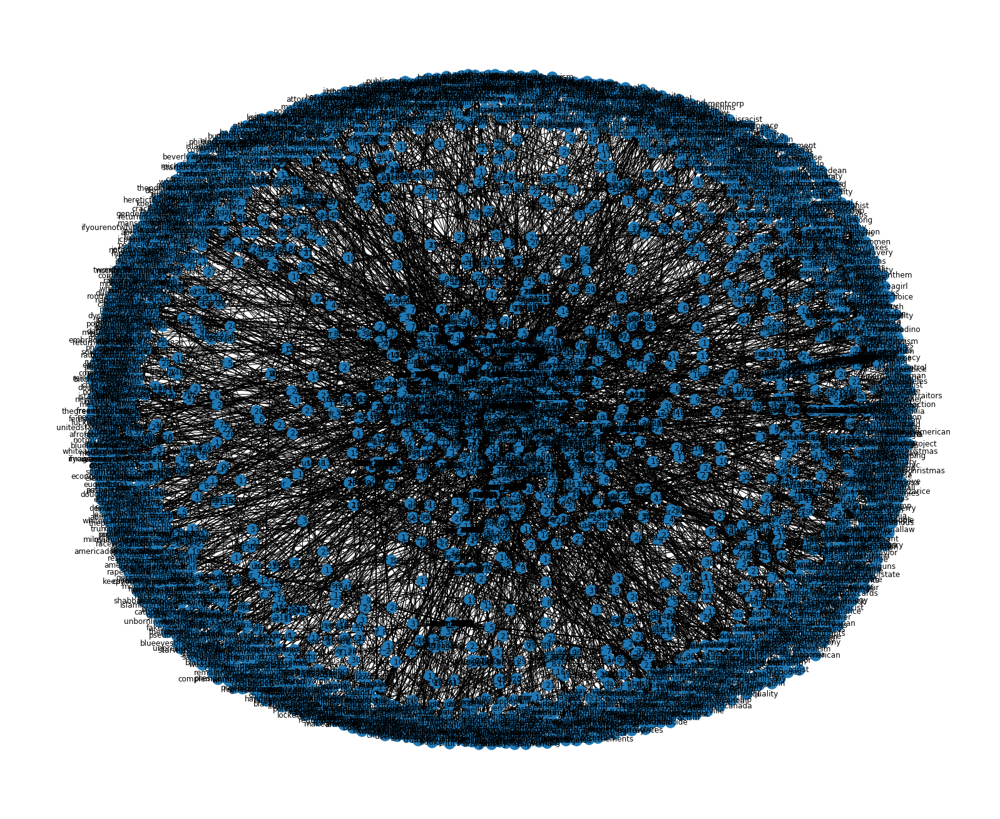

In [23]:
# Position nodes using Fruchterman-Reingold force-directed algorithm
pos = nx.spring_layout(pos_graph)

# Drawing the graph
from matplotlib.pyplot import figure
figure(figsize=(22, 18))
nx.draw(pos_graph, with_labels=True)
plt.show()

**Note:** from now on, we will focus on positive tweets because the positive class is our target

## 7. Positive hashtag network analysis

This includes:
    - Centrality measures
    - Ego-network
    - Users with one hashtag
    - Sub-graph analysis
    - Weekly connected components
    - Cliques
    - Clustering and Transitivity
    - Diameter and Distance

### A. Centrality measures

Now, we are going to focus on network centrality which captures the importance of a node’s position in the network considering: degree on the assumption that an important node will have many connections, closeness on the assumption that important nodes are close to other nodes, and finally, betweenness on the assumption that important nodes are well situated and connect other nodes.

In [26]:
# Centrality Metrics
# Calculating Centrality metrics for the Graph

dict_degree_centrality = nx.degree_centrality(pos_graph)
dict_closeness_centrality = nx.closeness_centrality(pos_graph)
dict_eigenvector_centrality = nx.eigenvector_centrality(pos_graph)
dict_pagerank_centrality = nx.pagerank(pos_graph)
dict_betweenness_centrality = nx.betweenness_centrality(pos_graph)

In [27]:
# Top 10 nodes with the largest values of degree centrality in descending order
dict(Counter(dict_degree_centrality).most_common(10))

{'trump': 0.038000000000000006,
 'politics': 0.027142857142857146,
 'allahsoil': 0.026285714285714287,
 'libtard': 0.021714285714285717,
 'liberal': 0.02142857142857143,
 'sjw': 0.021142857142857144,
 'retweet': 0.018000000000000002,
 'miami': 0.013142857142857144,
 'black': 0.012571428571428572,
 'hate': 0.009142857142857144}

In [28]:
# Top 10 nodes with the largest values of closeness centrality in descending order
dict(Counter(dict_closeness_centrality).most_common(10))

{'trump': 0.038,
 'politics': 0.027142857142857142,
 'allahsoil': 0.026285714285714287,
 'libtard': 0.021714285714285714,
 'liberal': 0.02142857142857143,
 'sjw': 0.021142857142857144,
 'retweet': 0.018,
 'miami': 0.013142857142857144,
 'black': 0.012571428571428572,
 'hate': 0.009142857142857144}

In [29]:
# Top 10 nodes with the largest values of eigenvector centrality in descending order
dict(Counter(dict_eigenvector_centrality).most_common(10))

{'trump': 0.4394757628499458,
 'politics': 0.3139278200468617,
 'allahsoil': 0.30401614035188135,
 'libtard': 0.25115384864531964,
 'liberal': 0.24784995541366034,
 'sjw': 0.24454606218200176,
 'retweet': 0.20820323663374007,
 'miami': 0.1520370516955179,
 'black': 0.14542926523219765,
 'hate': 0.10578254645227728}

In [30]:
# Top 10 nodes with the largest values of page rank in descending order
dict(Counter(dict_pagerank_centrality).most_common(10))

{'allahsoil': 0.009935774116430245,
 'trump': 0.008939592102313626,
 'politics': 0.004217644859421738,
 'libtard': 0.003584255909042572,
 'sjw': 0.0035494132948763308,
 'liberal': 0.0034526282555256615,
 'retweet': 0.003189372948491841,
 'black': 0.0025389774840553414,
 'bigot': 0.0023971182692356457,
 'hate': 0.0022027186044827297}

In [31]:
# Top 10 nodes with the largest values of betweenness centrality in descending order
dict(Counter(dict_betweenness_centrality).most_common(10))

{'user_13': 0.0,
 'cnn': 0.0,
 'michigan': 0.0,
 'tcot': 0.0,
 'user_14': 0.0,
 'australia': 0.0,
 'opkillingbay': 0.0,
 'seashepherd': 0.0,
 'helpcovedolphins': 0.0,
 'thecove': 0.0}

As we can see that node (hashtag) 'trump' shows to be in top for almost all centrality measures. However, and for betweenness centrality, no node comes with a score larger than zero!

### B. Ego-network

In [32]:
# construct a small network
ego_net = nx.ego_graph(pos_graph, "user_31196")
len(ego_net)

15

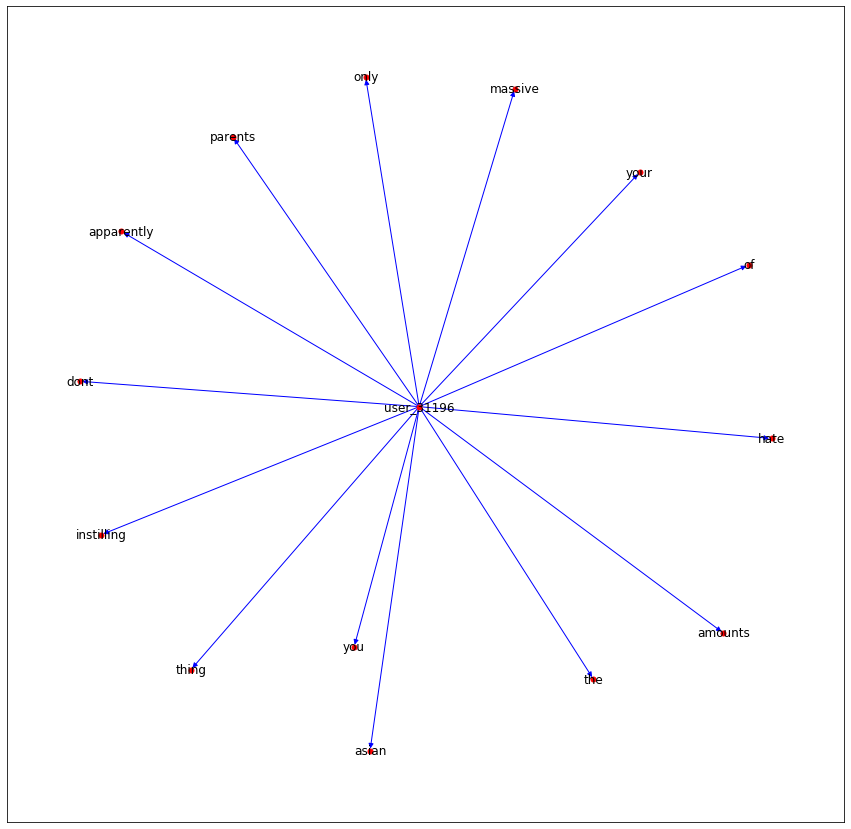

In [34]:
# Draw ego network
plt.figure(figsize=(15,15))
pos = nx.spring_layout(ego_net, k=.9)
nx.draw_networkx(ego_net, pos, node_size=25, node_color='red', with_labels=True, edge_color='blue')
plt.show()

### C. Users with one hashtag

In [35]:
# extract users having one hashtag
pos_tweet_grp_single = pos_tweet_grp[pos_tweet_grp['hash_count']==1]
pos_tweet_grp_single

,users,hash_count
11,user_10223,1
1436,user_6518,1
88,user_11438,1
1609,user_9670,1
1435,user_6500,1
...,...,...
961,user_26759,1
157,user_12789,1
1270,user_3348,1
609,user_20828,1


In [36]:
# extract information from orignal positive dataframe
one_hash_df = pos_tweet_df.loc[pos_tweet_df['users'].isin(pos_tweet_grp_single['users'])]
one_hash_df

,label,users,liststring
114,1.0,user_114,brexit
151,1.0,user_151,michelleobama
167,1.0,user_167,jewishsupremacist
263,1.0,user_263,
313,1.0,user_313,
...,...,...,...
31536,1.0,user_31536,mansplaining
31580,1.0,user_31580,whiteprivilege
31665,1.0,user_31665,antisemitism
31789,1.0,user_31789,paladino


In [37]:
# create a directed-graph from the positive tweets dataframe
one_hash_graph =nx.from_pandas_edgelist(one_hash_df, "users", "liststring",
                          create_using=nx.DiGraph())

In [38]:
# Get graph info
print(nx.info(one_hash_graph))

Name: 
Type: DiGraph
Number of nodes: 747
Number of edges: 443
Average in degree:   0.5930
Average out degree:   0.5930


In [39]:
# check if connected
one_hash_graph_un = one_hash_graph.to_undirected()
nx.is_connected(one_hash_graph_un)

False

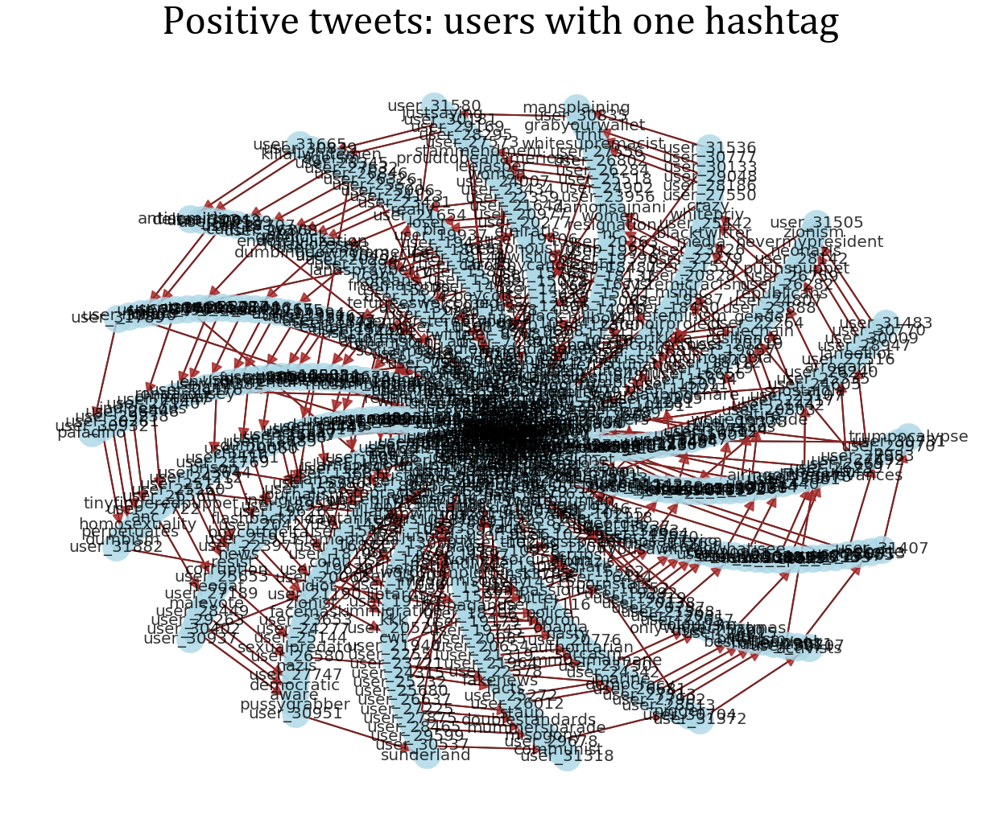

Total number of Edges= 443
Total number of Nodes= 747


In [40]:
# Position nodes using Fruchterman-Reingold force-directed algorithm
pos = nx.spiral_layout(one_hash_graph)

# Drawing the graph
from matplotlib.pyplot import figure
figure(figsize=(22, 18))

nx.draw_networkx_nodes(one_hash_graph, pos, node_size=50)
nx.draw_networkx_edges(one_hash_graph, pos, width=2.0)

nx.draw(one_hash_graph,
        pos=pos,
        with_labels=True, 
        edge_color='brown',
        edge_size=20,
        node_color='lightblue',
        node_size=1200,
        font_color='black',
        font_size=20,
        linewidths=0.25,
        arrowsize=30,
        dpi=5000,
        alpha=0.8,
        width=2)
plt.title('Positive tweets: users with one hashtag', fontsize=50, fontname='Cambria')
plt.box(on=None)
plt.axis('off')
plt.savefig('base.png', dpi=400)
plt.show()

# Additional metrics
print("Total number of Edges=", len(one_hash_graph.edges()))
print("Total number of Nodes=", len(one_hash_graph.nodes()))

### D. Sub-graph analysis

Components of a graph are the distinct maximally connected subgraphs. Now, that we confirm that our Graph is not connected, we can check how many connected components it has

In [41]:
# implemnted only for un-directed graphs

# convert graph to undirected
pos_graph_un = pos_graph.to_undirected()


subs = [] # to store (sub-graph index + length)
sub_graphs = (pos_graph_un.subgraph(c) for c in nx.connected_components(pos_graph_un))
for i, sub_graph in enumerate(sub_graphs):
    n_nodes = len(sub_graph.nodes())
    print("Subgraph {0} has {1} nodes".format(i, n_nodes))
    subs.append([i, n_nodes])

Subgraph 0 has 2562 nodes
Subgraph 1 has 3 nodes
Subgraph 2 has 2 nodes
Subgraph 3 has 4 nodes
Subgraph 4 has 2 nodes
Subgraph 5 has 7 nodes
Subgraph 6 has 2 nodes
Subgraph 7 has 2 nodes
Subgraph 8 has 2 nodes
Subgraph 9 has 3 nodes
Subgraph 10 has 2 nodes
Subgraph 11 has 2 nodes
Subgraph 12 has 3 nodes
Subgraph 13 has 4 nodes
Subgraph 14 has 2 nodes
Subgraph 15 has 3 nodes
Subgraph 16 has 2 nodes
Subgraph 17 has 2 nodes
Subgraph 18 has 2 nodes
Subgraph 19 has 2 nodes
Subgraph 20 has 2 nodes
Subgraph 21 has 5 nodes
Subgraph 22 has 2 nodes
Subgraph 23 has 3 nodes
Subgraph 24 has 4 nodes
Subgraph 25 has 3 nodes
Subgraph 26 has 6 nodes
Subgraph 27 has 9 nodes
Subgraph 28 has 4 nodes
Subgraph 29 has 9 nodes
Subgraph 30 has 2 nodes
Subgraph 31 has 5 nodes
Subgraph 32 has 3 nodes
Subgraph 33 has 9 nodes
Subgraph 34 has 5 nodes
Subgraph 35 has 4 nodes
Subgraph 36 has 4 nodes
Subgraph 37 has 2 nodes
Subgraph 38 has 6 nodes
Subgraph 39 has 2 nodes
Subgraph 40 has 2 nodes
Subgraph 41 has 2 nodes

It looks we have one **GIANT** component

In [42]:
# if to extract subgraphs based on condition
for component in list(nx.connected_components(pos_graph_un)):
    if len(component)== 2562:
        print(component)

{'user_12717', 'obamacare', 'ranting', 'user_30189', 'user_31667', 'user_25196', 'user_26333', 'user_1760', 'treats', 'user_4558', 'user_11375', 'user_31637', 'user_11604', 'user_19891', 'user_793', 'user_12840', 'anacoes', 'user_21367', 'user_23423', 'mrminority', 'user_19490', 'user_31580', 'user_23055', 'birdsofafeather', 'palestine', 'cell', 'donaldduck', 'goyim', 'user_30233', 'user_23649', 'barrackobama', 'blog', 'user_8466', 'crook', 'user_210', 'user_13987', 'harvardsq', 'user_24918', 'islamophobia', 'user_9670', 'dickhole', 'user_10650', 'stoptalking', 'user_25078', 'user_8954', 'europe', 'illegalisraelisettlements', 'user_12763', 'user_21385', 'black', 'baiter', 'rapechucktodd', 'hatespeech', 'populationcontrol', 'pamelaramseytaylor', 'user_11266', 'user_56', 'stopracism', 'starspangledbanner', 'user_21934', 'audism', 'nafris', 'burma', 'unitednations', 'zuma', 'zionism', 'weasel', 'dad', 'user_22146', 'user_5436', 'nye', 'user_23434', 'poopin', 'user_12007', 'freemilo', 'hyp

This sub-graph is a mix of users and hastags

In [43]:
# If we want to remove a subgraph based on a certain length
for component in list(nx.connected_components(pos_graph_un)):
    if len(component)==1:
        for node in component:
            pos_graph_un.remove_node(node)

### E. Weekly connected components

In [44]:
# only implemented for directed graphs
communities = nx.weakly_connected_components(pos_graph)

node_groups = []
for com in communities:
  node_groups.append(list(com))

color_map = []
for node in pos_graph:
    if node in node_groups[0]:
        color_map.append('orange')
    else: 
        color_map.append('red')

# number of connected components
print("number of connected components is: ", len(node_groups))

# Largest connected components
largest = max(nx.weakly_connected_components(pos_graph),key=len)
print("Length of Largest connected components is: ", len(largest))

# smallest connected components
smallest = min(nx.weakly_connected_components(pos_graph),key=len)
print("Length of the smallest connected components is: ", len(smallest))

number of connected components is:  297
Length of Largest connected components is:  2562
Length of the smallest connected components is:  2


In [45]:
# number of connected components
len(node_groups)

297

In [46]:
# Largest connected components
largest = max(nx.weakly_connected_components(pos_graph),key=len)
print(len(largest))
print(largest)

2562
{'user_12717', 'obamacare', 'ranting', 'user_30189', 'user_31667', 'user_25196', 'user_26333', 'user_1760', 'treats', 'user_4558', 'user_11375', 'user_31637', 'user_11604', 'user_19891', 'user_793', 'user_12840', 'anacoes', 'user_21367', 'user_23423', 'mrminority', 'user_19490', 'user_31580', 'user_23055', 'birdsofafeather', 'palestine', 'cell', 'donaldduck', 'goyim', 'user_30233', 'user_23649', 'barrackobama', 'blog', 'user_8466', 'crook', 'user_210', 'user_13987', 'harvardsq', 'user_24918', 'islamophobia', 'user_9670', 'dickhole', 'user_10650', 'stoptalking', 'user_25078', 'user_8954', 'europe', 'illegalisraelisettlements', 'user_12763', 'user_21385', 'black', 'baiter', 'rapechucktodd', 'hatespeech', 'populationcontrol', 'pamelaramseytaylor', 'user_11266', 'user_56', 'stopracism', 'starspangledbanner', 'user_21934', 'audism', 'nafris', 'burma', 'unitednations', 'zuma', 'zionism', 'weasel', 'dad', 'user_22146', 'user_5436', 'nye', 'user_23434', 'poopin', 'user_12007', 'freemilo',

In [47]:
# smallest connected components
smallest = min(nx.weakly_connected_components(pos_graph),key=len)
print(len(smallest))
print(smallest)

2
{'jewishsupremacist', 'user_167'}


### Largest component analysis

In [48]:
# extract the larest subgraph (extract subgraph) from original big graph
larg_ = pos_graph.subgraph(largest)

In [49]:
# Get graph info
print(nx.info(larg_))

Name: 
Type: DiGraph
Number of nodes: 2562
Number of edges: 4108
Average in degree:   1.6034
Average out degree:   1.6034


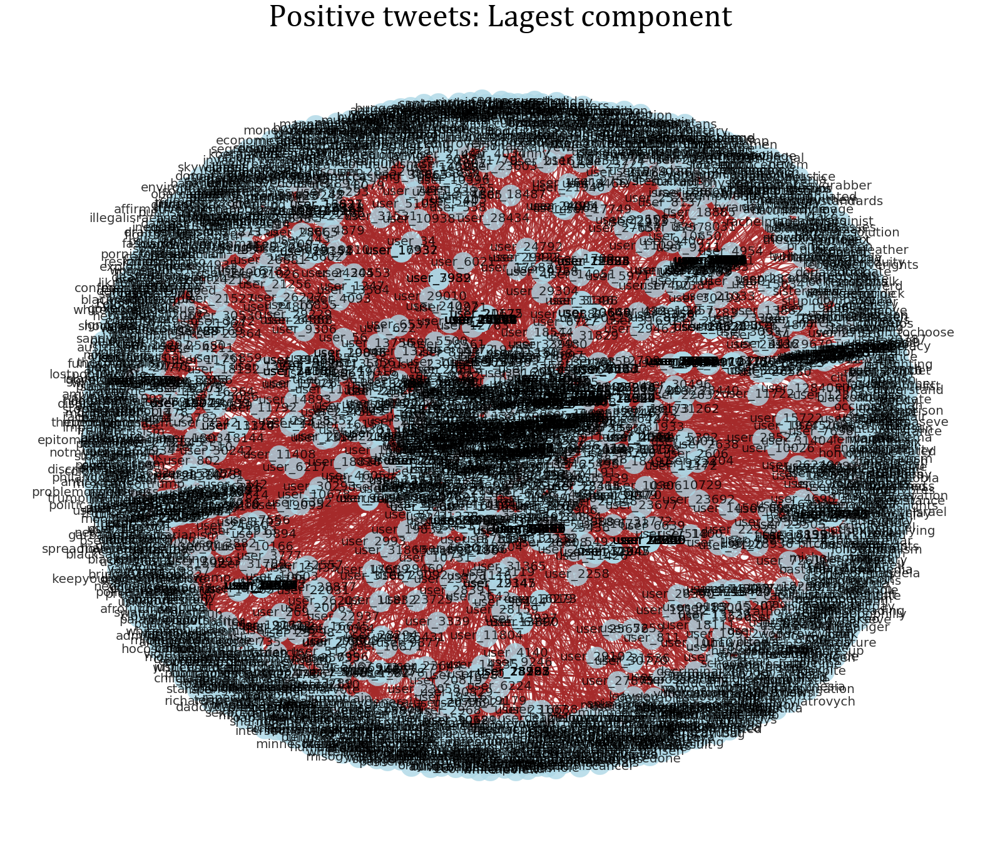

In [50]:
# Position nodes using Fruchterman-Reingold force-directed algorithm
pos = nx.spring_layout(larg_)

# Drawing the graph
from matplotlib.pyplot import figure
figure(figsize=(22, 18))

nx.draw(larg_,
        pos=pos,
        with_labels=True, 
        edge_color='brown',
        edge_size=20,
        node_color='lightblue',
        node_size=1200,
        font_color='black',
        font_size=20,
        linewidths=0.25,
        arrowsize=30,
        dpi=5000,
        alpha=0.8,
        width=2)
plt.title('Positive tweets: Lagest component', fontsize=50, fontname='Cambria')
plt.box(on=None)
plt.axis('off')
plt.savefig('base.png', dpi=400)
plt.show()

In [51]:
# sub-components of the largest component
larg_un = larg_.to_undirected()
nx.is_connected(larg_un)

True

And if we use the function nx.is_connected we’ll observe that the subgraph is connected as it should be.

### F. Cliques

In [52]:
# using find_cliques:

import networkx as nx
import itertools

larg_un = larg_un.to_undirected(larg_)
def find_cliques_size_k(larg_un, k):
    i = 0
    for clique in nx.find_cliques(larg_un):
        if len(clique) == k:
            i += 1
        elif len(clique) > k:
            i += len(list(itertools.combinations(clique, k)))
    return i

find_cliques_size_k(larg_un, 2)

4108

In [53]:
# Finding the Maximal Cliques associated with teh graph
a=nx.find_cliques(larg_un)
i=0

# For each clique, print the members and also print the total number of communities
for clique in a:
    print (clique)
    i+=1
total_comm_max_cl=i
print('Total number of communities: ',total_comm_max_cl)

['user_12717', 'shameful']
['user_12717', 'paladino']
['user_12717', 'public']
['obamacare', 'user_9650']
['ranting', 'user_7043']
['user_30189', 'slaver']
['user_30189', 'wypipo']
['user_31667', 'narrative']
['user_31667', 'dems']
['user_31667', 'marxism']
['user_25196', 'kkk']
['user_25196', 'hate']
['user_26333', 'politics']
['user_26333', 'sjw']
['user_26333', 'libtard']
['user_26333', 'liberal']
['user_1760', 'may']
['user_1760', 'love']
['user_1760', 'resolutions']
['user_1760', 'domesticviolence']
['user_1760', 'newyearseve']
['treats', 'user_23423']
['user_4558', 'humanrights']
['user_11375', 'cnn']
['user_11375', 'teambts']
['user_11375', 'allahsoil']
['user_11604', 'wso']
['user_11604', 'temple']
['user_11604', 'sikh']
['user_11604', 'calgary']
['user_31637', 'politics']
['user_31637', 'sjw']
['user_31637', 'libtard']
['user_31637', 'liberal']
['user_19891', 'jesus']
['user_19891', 'biggotry']
['user_19891', 'hateful']
['user_19891', 'black']
['user_12840', 'ris']
['anacoes',

['user_18416', 'words']
['user_18416', 'emiratis']
['trumpsamerica', 'user_2293']
['trumpsamerica', 'user_24027']
['trumpsamerica', 'user_16414']
['trumpsamerica', 'user_21940']
['user_16222', 'emiratis']
['moron', 'user_18231']
['moron', 'user_19179']
['moron', 'user_20064']
['government', 'user_31772']
['user_8994', 'projection']
['user_8994', 'patriotwatch']
['user_24775', 'tech']
['massive', 'user_31196']
['macys', 'user_10627']
['user_23644', 'news']
['asian', 'user_31196']
['user_10762', 'genocide']
['german', 'user_28210']
['german', 'user_25916']
['user_29819', 'mcconnell']
['user_16273', 'texas']
['uselections', 'user_12343']
['uselections', 'user_22285']
['uselections', 'user_25647']
['uselections', 'user_24004']
['uselections', 'user_12361']
['uselections', 'user_6379']
['uselections', 'user_13286']
['uselections', 'user_17857']
['uselections', 'user_27702']
['uselections', 'user_10693']
['uselections', 'user_18962']
['uselections', 'user_10734']
['psychopath', 'user_19623']

In [54]:
import itertools
cliques = nx.find_cliques(larg_un)
cliques = set(sum([list(itertools.combinations(set(clq), 2)) for clq in cliques if len(clq)>=2],[]))
cliques

{('user_23430', 'us'),
 ('user_7156', 'cologne'),
 ('stereotypes', 'user_7187'),
 ('user_5246', 'pegida'),
 ('trumpusa', 'user_24624'),
 ('user_9688', 'miami'),
 ('user_30242', 'ncaa'),
 ('user_1374', 'trump'),
 ('words', 'user_29879'),
 ('apaheid', 'user_23649'),
 ('hateful', 'user_19891'),
 ('user_27895', 'tedtalks'),
 ('trump', 'user_8772'),
 ('kkk', 'user_13343'),
 ('user_27577', 'liberal'),
 ('user_25156', 'hate'),
 ('retweet', 'user_30066'),
 ('user_8541', 'crook'),
 ('libtard', 'user_23718'),
 ('user_31026', 'youngturks'),
 ('politics', 'user_23505'),
 ('sjw', 'user_27757'),
 ('user_4262', 'carl'),
 ('user_10833', 'maga'),
 ('user_10898', 'black'),
 ('user_19338', 'homophobia'),
 ('user_20269', 'theview'),
 ('fear', 'user_18435'),
 ('feminismiscancer', 'user_13547'),
 ('tcot', 'user_25436'),
 ('user_10318', 'libtard'),
 ('user_12381', 'libtard'),
 ('rapist', 'user_579'),
 ('user_24970', 'clinton'),
 ('user_19492', 'liberal'),
 ('audiblechannels', 'user_9519'),
 ('user_1116', 'mi

total cliques: 4108
max clique length: 2


Text(0.5, 1.0, 'Cliques distribution')

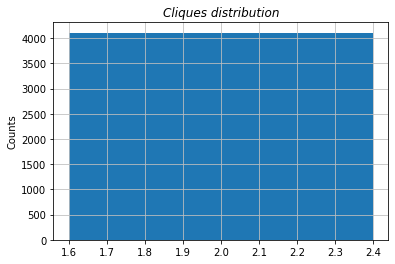

In [55]:
cliques=[c for c in nx.find_cliques(larg_un.to_undirected())]
cliques_length=[len(c) for c in nx.find_cliques(larg_un.to_undirected())]

print ("total cliques: %d"%len(cliques_length))
print ("max clique length: %d"%max(cliques_length))
#print ("average clique length: %d"%average(cliques_length))

cliques_dist=Counter(cliques_length).most_common()

title="Cliques distribution"

plt.bar([c[0]for c in cliques_dist ],[c[1]for c in cliques_dist ])
plt.grid(True,linestyle='-',color='0.75')
plt.ylabel('Counts')
plt.title(title,fontstyle='italic')

**Question**

Why can't we see cliques larger than 2?

### G. Clustering and Transitivity

Clustering and transitivity measure the tendency for nodes to cluster together or for edges to form triangles. In our context, they are measures of the extent to which the users interacting with one particular user tend to interact with each other as well. The difference is that transitivity weights nodes with a large degree higher.

1. **The clustering coefficient,** a measure of the number of triangles in a graph, is calculated as the number of triangles connected to node i divided by the number of sets of two edges connected to node i (Triple nodes). 
2. **The transitivity coefficient** is calculated as 3 multiply by the number of triangles in the network divided by the number of connected triples of nodes in the network. 

These two parameters are very important when analyzing social networks because it gives us an insight into how users tend to create tightly knot groups characterized by relatively high-dense ties.

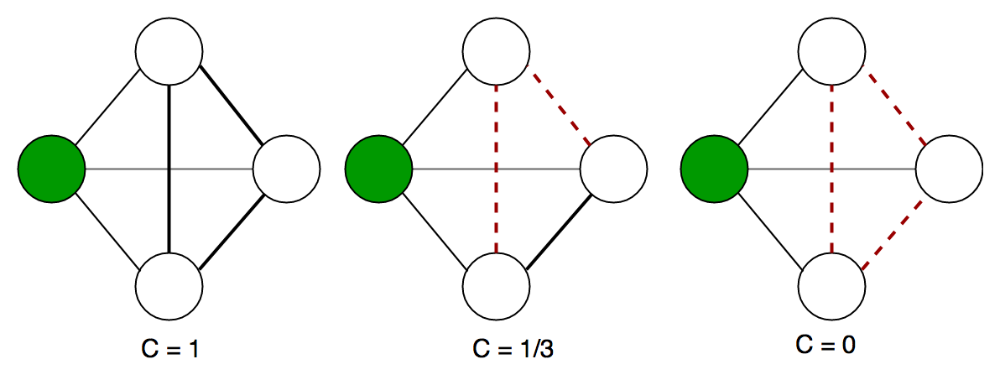

In [74]:
# Clustering coefficient in a graph
path="C:\\Users\\lenovo\\Tutorials\\03. Data Science\\DS images 2\\clustering-coefficient-in-graph-theory-1.png"
display(Image.open(path))

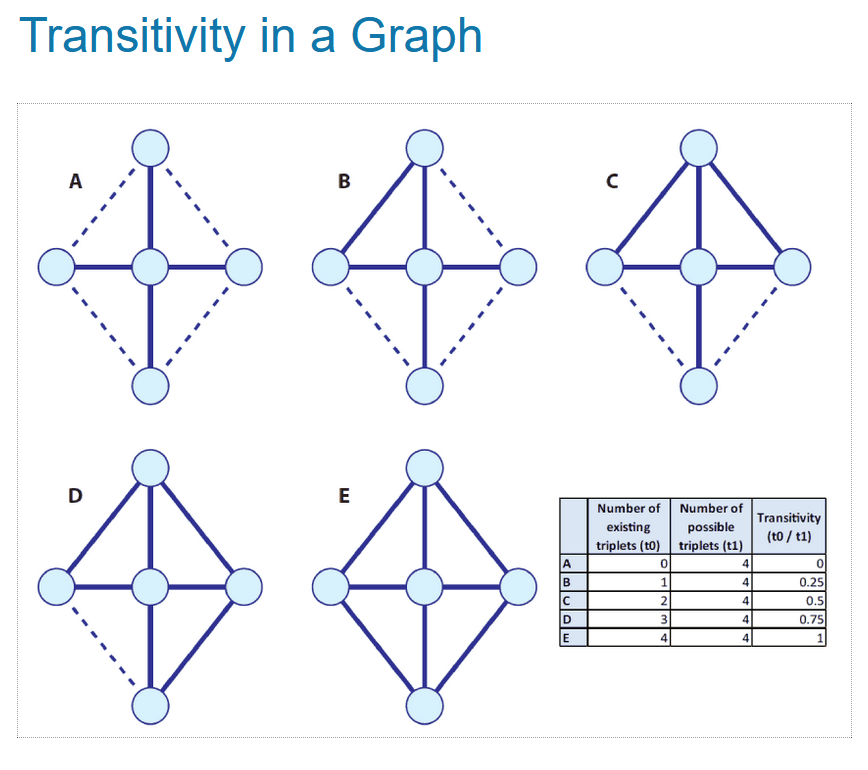

In [73]:
# Transitivity in a graph
path="C:\\Users\\lenovo\\Tutorials\\03. Data Science\\DS images 2\\transitivity.png"
display(Image.open(path))

Let’s take a look at what is happening in our analysis using the functions average_clustering and transitivity:

In [58]:
# Clustering coefficient: For each node find the fraction of possible triangles that are triangles
c=nx.clustering(larg_)
c

{'user_13': 0,
 'cnn': 0,
 'michigan': 0,
 'tcot': 0,
 'user_14': 0,
 'australia': 0,
 'opkillingbay': 0,
 'seashepherd': 0,
 'helpcovedolphins': 0,
 'thecove': 0,
 'user_34': 0,
 'neverump': 0,
 'xenophobia': 0,
 'user_56': 0,
 'love': 0,
 'peace': 0,
 'user_77': 0,
 'race': 0,
 'identity': 0,
 'med': 0,
 'user_82': 0,
 'altright': 0,
 'whitesupremacy': 0,
 'user_111': 0,
 'linguistics': 0,
 'power': 0,
 'raciolinguistics': 0,
 'user_114': 0,
 'brexit': 0,
 'user_131': 0,
 'people': 0,
 'trump': 0,
 'republican': 0,
 'user_151': 0,
 'michelleobama': 0,
 'user_192': 0,
 'libtard': 0,
 'sjw': 0,
 'liberal': 0,
 'politics': 0,
 'user_210': 0,
 'trash': 0,
 'hate': 0,
 'user_264': 0,
 'stereotyping': 0,
 'prejudice': 0,
 'hope': 0,
 'conflict': 0,
 'user_269': 0,
 'bluelivesmatter': 0,
 'draintheswamp': 0,
 'ferguson': 0,
 'user_321': 0,
 'antisemitism': 0,
 'hocoschools': 0,
 'columbiamd': 0,
 'hocomd': 0,
 'user_332': 0,
 'nazi': 0,
 's': 0,
 'hatred': 0,
 'bigotry': 0,
 'user_354': 0,


In [72]:
# Compute graph transitivity, the fraction of all possible triangles present in G.
# Possible triangles are identified by the number of “triads” (two edges with a shared vertex).
tr=nx.transitivity(larg_)
tr

0

It appears that in our graph, the users do not tend to form close clusterings. The reason is taht in Twitter, there are three types of interactions between two Twitter users that we are interested in: retweets, replies, and mentions. NONE of these interactions is available in the current dataset.

**After that,** we’ll investigate some summary statistics, particularly related to distance, or how far away one node is from another random node. 

### H. Diameter and Distance

Diameter represents the maximum distance between any pair of nodes while the average distance tells us the average distance between any two nodes in the network.

NetworkX facilitates the functions diameter and average_shortest_path_length to obtain these parameters

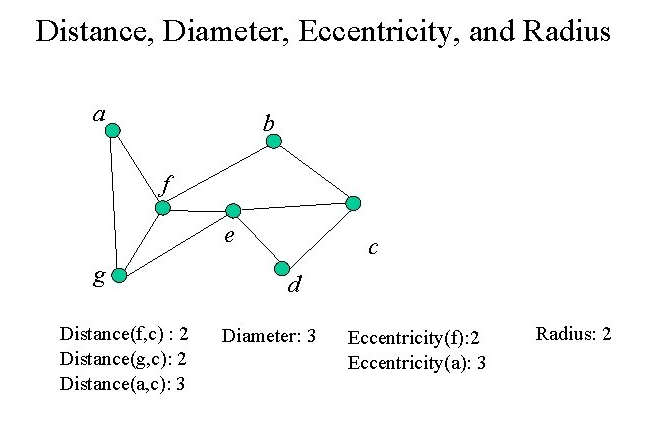

In [87]:
# distnace measures in a graph
path="C:\\Users\\lenovo\\Tutorials\\03. Data Science\\DS images 2\\image-20.jpg"
display(Image.open(path))

In [77]:
# convert to undirected
larg_un = larg_.to_undirected()

In [76]:
# The diameter of a graph is the longest of all possible shortest paths in the graph.

if nx.is_connected(larg_un):
    print('average path length: {}'.format(nx.average_shortest_path_length(larg_un)))
    print('average diameter: {}'.format(nx.diameter(larg_un)))

average path length: 7.493729731476257
average diameter: 20


In [78]:
# Returns the eccentricity of nodes in G.
# The eccentricity of a node v is the maximum distance from v to all other nodes in G.

nx.eccentricity(larg_un)

{'user_13': 13,
 'cnn': 14,
 'michigan': 14,
 'tcot': 12,
 'user_14': 15,
 'australia': 14,
 'opkillingbay': 14,
 'seashepherd': 14,
 'helpcovedolphins': 16,
 'thecove': 14,
 'user_34': 13,
 'neverump': 14,
 'xenophobia': 12,
 'user_56': 15,
 'love': 14,
 'peace': 14,
 'user_77': 13,
 'race': 12,
 'identity': 14,
 'med': 14,
 'user_82': 13,
 'altright': 12,
 'whitesupremacy': 12,
 'user_111': 13,
 'linguistics': 14,
 'power': 14,
 'raciolinguistics': 14,
 'user_114': 13,
 'brexit': 12,
 'user_131': 11,
 'people': 12,
 'trump': 10,
 'republican': 12,
 'user_151': 13,
 'michelleobama': 12,
 'user_192': 13,
 'libtard': 14,
 'sjw': 12,
 'liberal': 12,
 'politics': 12,
 'user_210': 13,
 'trash': 14,
 'hate': 12,
 'user_264': 13,
 'stereotyping': 14,
 'prejudice': 13,
 'hope': 14,
 'conflict': 14,
 'user_269': 13,
 'bluelivesmatter': 14,
 'draintheswamp': 12,
 'ferguson': 14,
 'user_321': 13,
 'antisemitism': 12,
 'hocoschools': 14,
 'columbiamd': 14,
 'hocomd': 14,
 'user_332': 11,
 'nazi':

In [85]:
# eccentricity for one node
nx.eccentricity(larg_un, v="user_13")

13